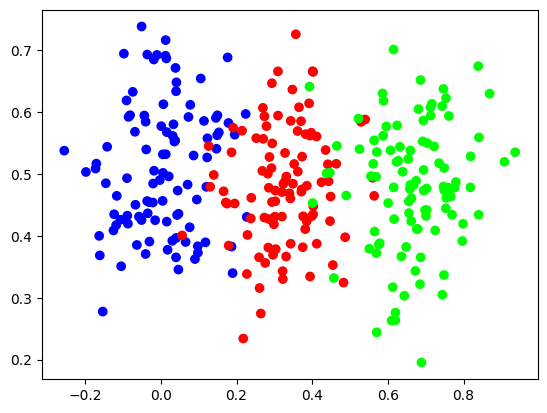

In [1]:
import nnfs
from nnfs.datasets import vertical_data

nnfs.init()

num_classes = 3
x,y = vertical_data(100,num_classes)

import matplotlib.pyplot as plt

plt.scatter(x[:, 0], x[:, 1], c =y, cmap = "brg")
plt.show()

In [2]:
import network
from network import NeuralNetwork
import layer_dense as ld

nn = NeuralNetwork()
# here 2 is the shape of the input.
nn.add(ld.layer_dense(2, 64))
nn.add(ld.Ac_relu())
nn.add(ld.layer_dense(64, 64))
nn.add(ld.Ac_relu())
nn.add(ld.layer_dense(64, 3))
nn.add(ld.Ac_softmax())


out = nn.forward(x)
print(out)


(300, 2)   (2, 64)
(300, 64)   (64, 64)
(300, 64)   (64, 3)
[[0.33375957 0.33964174 0.3265987 ]
 [0.33377085 0.33695813 0.32927102]
 [0.33356059 0.33673849 0.32970092]
 [0.33330423 0.33836243 0.32833334]
 [0.3328965  0.3361535  0.33095   ]
 [0.33456107 0.34061808 0.32482086]
 [0.33374549 0.33763393 0.32862059]
 [0.33399483 0.33780103 0.32820414]
 [0.33435031 0.34060575 0.32504394]
 [0.33415073 0.33995179 0.32589748]
 [0.33426668 0.34047962 0.3252537 ]
 [0.33374094 0.33876746 0.32749161]
 [0.33374698 0.33726321 0.32898981]
 [0.33427799 0.34053336 0.32518865]
 [0.33391003 0.33807644 0.32801353]
 [0.33407677 0.33927842 0.32664481]
 [0.33372522 0.33879388 0.3274809 ]
 [0.33409177 0.33842602 0.32748221]
 [0.33405589 0.33909093 0.32685318]
 [0.33439423 0.33954135 0.32606442]
 [0.33555098 0.33860313 0.32584589]
 [0.33375049 0.33706951 0.32917999]
 [0.33389981 0.33842366 0.32767653]
 [0.33442541 0.33998931 0.32558528]
 [0.33266555 0.33622401 0.33111044]
 [0.3345179  0.33832586 0.32715624]
 [0.

In [3]:
#lets calculate loss here 

loss = ld.loss_CategoricalCrossEntropy()
l = loss.calculate_loss(out,y,3)

print(l)

1.091325860451616


In [13]:
#optimization by randomly picking a weights and biases combination
import numpy as np


d1 = ld.layer_dense(2,3)
a1 = ld.Ac_relu()
d2 = ld.layer_dense(3,3)
a2 = ld.Ac_softmax()

lf = ld.loss_CategoricalCrossEntropy()

best_loss = 99999

w1_copy = d1.weights
b1_copy = d1.biases

w2_copy = d2.weights
b2_copy = d2.biases

for i in range(100000):

    d1.weights = 0.05*np.random.randn(2,3)
    d1.biases = 0.05*np.random.randn(1,3)

    d2.weights = 0.05*np.random.randn(3,3)
    d2.biases = 0.05*np.random.randn(1,3)

    nn = NeuralNetwork()
    nn.add(d1)
    nn.add(a1)
    nn.add(d2)
    nn.add(a2)

    predictions = nn.forward(x)
    loss = lf.calculate_loss(predictions,y,3)

    if loss < best_loss:
        best_loss = loss
        print(f"new best loss : {best_loss}")

        #restore best weights and biases
        w1_copy = d1.weights.copy()
        b1_copy = d1.biases.copy()

        w2_copy = d2.weights.copy()
        b2_copy = d2.biases.copy()
        best_loss = loss
    else:
        d1.weights = w1_copy.copy()
        d1.biases = b1_copy.copy()

        d2.weights = w2_copy.copy()
        d2.biases = b2_copy.copy()


(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0989884622730355
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0986080284966164
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0982059474506283
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3

In [14]:
print(best_loss)

1.0952937047630895


In [11]:
#optimization by randomly tweaking weights and biases

import numpy as np


d1 = ld.layer_dense(2,3)
a1 = ld.Ac_relu()
d2 = ld.layer_dense(3,3)
a2 = ld.Ac_softmax()

lf = ld.loss_CategoricalCrossEntropy()

best_loss = 99999

w1_copy = d1.weights
b1_copy = d1.biases

w2_copy = d2.weights
b2_copy = d2.biases

for i in range(100000):

    d1.weights += 0.05*np.random.randn(2,3)
    d1.biases += 0.05*np.random.randn(1,3)

    d2.weights += 0.05*np.random.randn(3,3)
    d2.biases += 0.05*np.random.randn(1,3)

    nn = NeuralNetwork()
    nn.add(d1)
    nn.add(a1)
    nn.add(d2)
    nn.add(a2)

    predictions = nn.forward(x)
    loss = lf.calculate_loss(predictions,y,3)

    if loss < best_loss:
        best_loss = loss
        print(f"new best loss : {best_loss}")

        #restore best weights and biases
        w1_copy = d1.weights.copy()
        b1_copy = d1.biases.copy()

        w2_copy = d2.weights.copy()
        b2_copy = d2.biases.copy()
        best_loss = loss
    else:
        d1.weights = w1_copy.copy()
        d1.biases = b1_copy.copy()

        d2.weights = w2_copy.copy()
        d2.biases = b2_copy.copy()


(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0958929494494514
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0873750416568668
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0852854421491698
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.079916189300246
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0779377001691826
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0744292129243234
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0691229594675444
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0678964105992987
(300, 2)   (2, 3)
(300, 3)   (3, 3)
(300, 2)   (2, 3)
(300, 3)   (3, 3)
new best loss : 1.0626878858689903
(3

In [ ]:
print(best_loss)
#cleaqrly it performs well now, but this is not enough, vertical dataset is fairly still simple.
# we need better optimization techniques
#we will see what can be done.


0.17279241017993277
